In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ds_path = '/content/drive/MyDrive/art_Project'
# wclasses = '/content/drive/MyDrive/art_Project/wclasses.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pandas
import pandas as pd
import os

In [ ]:
df_classes = pd.read_csv(f"{ds_path}/classes.csv")

In [ ]:
"""
filenames = [ f"{ds_path}/{f}" for f in df_classes["filename"].values ]

c = 0
for f in filenames:
    if not os.path.isfile(f):
        c += 1
        print(f)
    if c > 20:
        break
"""

'\nfilenames = [ f"{ds_path}/{f}" for f in df_classes["filename"].values ]\n\nc = 0\nfor f in filenames:\n    if not os.path.isfile(f):\n        c += 1\n        print(f)\n    if c > 20:\n        break\n'

In [ ]:
"""
def patch_filename (f):
    f = f.replace("ã¨","├г┬и").replace("ã­","├г┬н").replace("ã©","├г┬й").replace("ã³","├г┬│")
    f = f.replace("ã¶","├г┬╢").replace("ã¼","├г┬╝").replace("â\xa0","├в┬а")
    return f



df_classes = pd.read_csv(f"{ds_path}/classes.csv")
df_classes["filename"] = df_classes["filename"].map(lambda filename: patch_filename(filename) )
"""

'\ndef patch_filename (f):\n    f = f.replace("ã¨","├г┬и").replace("ã\xad","├г┬н").replace("ã©","├г┬й").replace("ã³","├г┬│")\n    f = f.replace("ã¶","├г┬╢").replace("ã¼","├г┬╝").replace("â\xa0","├в┬а")\n    return f\n\n\n\ndf_classes = pd.read_csv(f"{ds_path}/classes.csv")\ndf_classes["filename"] = df_classes["filename"].map(lambda filename: patch_filename(filename) )\n'

In [ ]:
"""
filenames = [ f"{ds_path}/{f}" for f in df_classes["filename"].values ]


for f in filenames:
    if not os.path.isfile(f):
        print(f)
"""

'\nfilenames = [ f"{ds_path}/{f}" for f in df_classes["filename"].values ]\n\n\nfor f in filenames:\n    if not os.path.isfile(f):\n        print(f)\n'

In [ ]:
# df_classes["filename"] = df_classes["filename"].map(lambda filename: patch_filename(filename))

# Değişiklikleri doğrudan mevcut CSV dosyasına kaydet
df_classes.to_csv(f"{ds_path}/classes.csv", index=False)


In [ ]:
print(df_classes.head())

                                            filename         artist  \
0  Abstract_Expressionism/aaron-siskind_acolman-1...  aaron siskind   
1  Abstract_Expressionism/aaron-siskind_chicago-6...  aaron siskind   
2  Abstract_Expressionism/aaron-siskind_glouceste...  aaron siskind   
3  Abstract_Expressionism/aaron-siskind_jerome-ar...  aaron siskind   
4  Abstract_Expressionism/aaron-siskind_kentucky-...  aaron siskind   

                        genre          description             phash  width  \
0  ['Abstract Expressionism']       acolman-1-1955  bebbeb018a7d80a8   1922   
1  ['Abstract Expressionism']       chicago-6-1961  d7d0781be51fc00e   1382   
2  ['Abstract Expressionism']  gloucester-16a-1944  9f846e5a6c639325   1382   
3  ['Abstract Expressionism']  jerome-arizona-1949  a5d691f85ac5e4d0   1382   
4  ['Abstract Expressionism']      kentucky-4-1951  880df359e6b11db1   1382   

   height  genre_count subset  
0    1382            1  train  
1    1746            1  train  
2 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
"""
0 = all messages are logged (default behavior)
1 = INFO messages are not printed
2 = INFO and WARNING messages are not printed
3 = INFO, WARNING, and ERROR messages are not printed
"""
import tensorflow as tf
import math

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from tqdm.notebook import tqdm

import pickle

In [ ]:
# görüntü ön işleme
def resize(image, size):
    image = tf.image.resize(image, [size, size])
    return image

# Üst Örnekleme ve Kaba Bırakma

In [ ]:
def dropout(img, size, p , count , cutout_masksize ):
    p = tf.cast( tf.random.uniform([],0,1)<p, tf.int32)
    if (p==0)|(count==0)|(cutout_masksize==0): return img

    for k in range(count):
        x = tf.cast( tf.random.uniform([],0,size),tf.int32)
        y = tf.cast( tf.random.uniform([],0,size),tf.int32)

        width = tf.cast( cutout_masksize*size,tf.int32)
        ya = tf.math.maximum(0,y-width//2)
        yb = tf.math.minimum(size,y+width//2)
        xa = tf.math.maximum(0,x-width//2)
        xb = tf.math.minimum(size,x+width//2)

        one = img[ya:yb,0:xa,:]
        two = tf.zeros([yb-ya,xb-xa,3] )
        three = img[ya:yb,xb:size,:]
        middle = tf.concat([one,two,three],axis=1)
        img = tf.concat([img[0:ya,:,:],middle,img[yb:size,:,:]],axis=0)


    img = tf.reshape(img,[size,size,3])
    return img

In [ ]:
def preprocess_image(file_path, label, augmentation = False, rescale = True, crop_size = None, crop_p = None, cutout_count = None, cutout_p = None,  cutout_masksize = None):
    img = tf.io.read_file(file_path)
    img = tf.io.decode_jpeg(img, channels=3)

    if augmentation:
        crop_p = tf.cast( tf.random.uniform([],0,1)<crop_p, tf.float32)
        r= 1.0 + crop_size*np.random.random()*crop_p


        img = resize (img, size=int(IMG_SIZE*r))
        img = tf.image.random_crop(
            img, size=[IMG_SIZE, IMG_SIZE, 3]
        )


        img = tf.image.random_flip_left_right(
            img
        )
        if cutout_count > 0:
            img = dropout(img, size = IMG_SIZE, p = cutout_p, count = cutout_count, cutout_masksize = cutout_masksize)

    else:
        img = resize (img, size=IMG_SIZE)

    if rescale:
        img = tf.cast( img, tf.float32) / 255.0


    return img, label



In [ ]:
def train_preprocess_image(file_path, label):
    return preprocess_image(file_path, label, augmentation = True, rescale = True,
                            crop_size = CROP_SIZE, crop_p = CROP_P,
                            cutout_count=CUTOUT_COUNT,
                            cutout_p = CUTOUT_P,
                            cutout_masksize= CUTOUT_MASKSIZE)

def test_preprocess_image(file_path, label):
    return preprocess_image(file_path, label, augmentation = False, rescale = True)


In [ ]:
def configure_ds_for_performance(ds, batch_size, shuffle, shuffle_buffer_size=32, shuffle_seed=42, reshuffle_each_iteration=True):
    #ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(buffer_size=shuffle_buffer_size, seed=shuffle_seed, reshuffle_each_iteration = reshuffle_each_iteration)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    return ds

In [ ]:
def create_ds(df, ds_path):
    filenames = [ f"{ds_path}/{filename}" for filename in  df["filename"].values]
    labels = [artist for artist in df["artist_class"]]
    ds = tf.data.Dataset.from_tensor_slices((filenames, labels))
    return ds

In [ ]:
def show_samples (df_train, ds_path):

    df = df_train.sample(n=100, random_state=421)

    filenames = [ f"{ds_path}/{filename}" for filename in  df["filename"].values]
    labels = df["description"].values
    plt.figure(figsize=(30, 30))
    for n, (filename, label) in enumerate(zip(filenames,labels)):
        if n < 10*10:
            image, label = preprocess_image(filename, label, augmentation=False, rescale = False)

            ax = plt.subplot(10, 10, n+1)
            plt.imshow(image.numpy().astype("uint8"))
            #plt.title(label)
            plt.axis("off")
    plt.show()

In [ ]:
def show_augmentation (df_train, ds_path):

    df = df_train.sample(n=100, random_state=421)
    filenames = [ f"{ds_path}/{filename}" for filename in  df["filename"].values]
    labels = df["description"].values

    plt.figure(figsize=(15, 30))
    for n, (filename, label) in enumerate(zip(filenames,labels)):
        if n < 10:
            image, label = preprocess_image(filename, label, augmentation=False, rescale = False)
            ax = plt.subplot(10, 5, 5*n + 1)

            ax.imshow(image.numpy().astype("uint8"))
            ax.set_title( label )
            ax.axis("off")
            for i in range(4):
                ax = plt.subplot(10, 5, 5*n + 2+i)
                image_aug, label = preprocess_image(filename, label, augmentation=True, rescale = False,
                                                crop_size = CROP_SIZE, crop_p = CROP_P,
                                                cutout_count=CUTOUT_COUNT, cutout_p = CUTOUT_P,  cutout_masksize=CUTOUT_MASKSIZE)

                ax.imshow(image_aug.numpy().astype("uint8"))
                ax.axis("off")


In [ ]:
def show_predictions (df_test, ds_path, class_names):
    row=5
    col=5
    df = df_test.sample(n=row*col, random_state=123)

    filenames = [ f"{ds_path}/{filename}" for filename in  df["filename"].values]
    labels = df["artist"].values
    preds = [ class_names[i] for i in df["pred"].values ]
    plt.figure(figsize=(3*col, 3*row))
    for n, (filename, label) in enumerate(zip(filenames,labels)):
        if n < row*col:
            image, label = preprocess_image(filename, label, augmentation=False, rescale = False)
            pred = preds[n]
            fg_color = 'white'

            if pred == label:
                fg_color = "green"
                title = pred
            else:
                fg_color = "red"
                title = f"{pred}\n({label})"

            ax = plt.subplot(row, col, n+1)
            ax.set_title(title, color = fg_color)
            ax.imshow(image.numpy().astype("uint8"))

            ax.axis("off")
    plt.tight_layout()
    plt.show()


# MODEL

In [ ]:
EFFICIENT_NETS = [
    tf.keras.applications.efficientnet.EfficientNetB0,
    tf.keras.applications.efficientnet.EfficientNetB1,
    tf.keras.applications.efficientnet.EfficientNetB2,
    tf.keras.applications.efficientnet.EfficientNetB3,
    tf.keras.applications.efficientnet.EfficientNetB4,
    tf.keras.applications.efficientnet.EfficientNetB5,
    tf.keras.applications.efficientnet.EfficientNetB6,
    tf.keras.applications.efficientnet.EfficientNetB7,
]

EFFNET_B0 = EFFICIENT_NETS [0]
EFFNET_B1 = EFFICIENT_NETS [1]
EFFNET_B2 = EFFICIENT_NETS [2]
EFFNET_B3 = EFFICIENT_NETS [3]
EFFNET_B4 = EFFICIENT_NETS [4]
EFFNET_B5 = EFFICIENT_NETS [5]
EFFNET_B6 = EFFICIENT_NETS [6]
EFFNET_B7 = EFFICIENT_NETS [7]



In [ ]:
def build_model(n_classes, return_feature_extractor_model = False):


    inp = tf.keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
    base_model = EFFNET(include_top=False, weights="imagenet",input_tensor=inp, drop_connect_rate=EFFNET_DROP_CONNCET_RATE )

    x = base_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    if return_feature_extractor_model:
        feat_extractor1 = x
    x = tf.keras.layers.Dense(HEAD_DENSE_LAYER,name="head_dense_512", kernel_initializer='he_uniform')(x)

    if return_feature_extractor_model:
        feat_extractor2 = x

    x = tf.keras.layers.Dropout(HEAD_DROPOUT)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    if return_feature_extractor_model:
        feat_extractor = tf.keras.layers.concatenate ([feat_extractor1, feat_extractor2])

    output = tf.keras.layers.Dense(n_classes, activation='softmax')(x)

    model = tf.keras.Model(inputs=base_model.input, outputs=output)
    if return_feature_extractor_model:
        model_fe = tf.keras.Model(inputs=base_model.input, outputs=feat_extractor)
        return model, model_fe
    else:
        return model

In [ ]:
def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        decay_total_epochs = EPOCHS - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS - 1
        decay_epoch_index = epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS
        phase = math.pi * decay_epoch_index / decay_total_epochs
        cosine_decay = 0.5 * (1 + math.cos(phase))
        lr = (LR_MAX - LR_MIN) * cosine_decay + LR_MIN
    return lr

In [ ]:
# train grafiği

def plot_training(history):
    acc = history['accuracy']
    val_acc = history['val_accuracy']
    loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(len(acc))

    fig, axes = plt.subplots(1, 3, figsize=(20,5))

    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].legend(loc='best')

    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].legend(loc='best')

    lr = history['lr']
    axes[2].plot(epochs, lr, 'b', label='LR Loss')
    axes[2].set_title('Learning rate')
    axes[2].legend(loc='best')


    plt.show()

In [ ]:
N_TOP = 25

IMG_SIZE = 300

CUTOUT_COUNT = 5
CUTOUT_P = 0.75
CUTOUT_MASKSIZE = 0.2

CROP_SIZE = 0.5
CROP_P = 0.75


LR_START = 1e-06
LR_MAX = 5e-5
LR_MIN = 1e-9
LR_RAMPUP_EPOCHS = 5
LR_SUSTAIN_EPOCHS = 25
EPOCHS = 100


EFFNET = EFFNET_B3

TF_VERBOSE = 2


EFFNET_DROP_CONNCET_RATE = 0.35
HEAD_DENSE_LAYER = 512
HEAD_DROPOUT = 0.25


ds_path = '/content/drive/MyDrive/art_Project'
output_path = '/content/drive/MyDrive/art_Project/outputs'
batch_size = 16

# Veri Kümesinin Küçültülmesi


In [ ]:
df_classes = pd.read_csv(f"{ds_path}/classes.csv")
print(f"df_classes:{df_classes.shape}")

df = df_classes.groupby(["subset","artist"]).size().reset_index()
df.columns = ["subset", "artist", "size"]
df = df.pivot(index="artist",columns="subset", values="size")
df = df.reset_index()
df = df.fillna(0).sort_values(by="train", ascending=False)
df["train"] = df["train"].astype(np.int16)
df["test"] = df["test"].astype(np.int16)
df["uncertain artist"] = df["uncertain artist"].astype(np.int16)

df=df.sort_values(by="train", ascending=False)

top_artists = df["artist"].values[:N_TOP]
display(df.head(N_TOP))

df_all = df_classes[df_classes["artist"].isin(top_artists)].reset_index(drop = True)
le = LabelEncoder()
df_all["artist_class"] = le.fit_transform(df_all["artist"].values)
class_names = le.classes_

with open('class_names.pickle', 'wb') as handle:
    pickle.dump(class_names, handle)


df_train = df_all.query("subset == 'train'").reset_index(drop = True)
df_test = df_all.query("subset == 'test'").reset_index(drop = True)


df_train, df_valid, y_train, y_valid =  train_test_split(df_train, df_train["artist"],
                                                                   test_size=0.2, random_state=42,
                                                                   stratify=df_train["artist"])


print(f"train:{df_train.shape[0]}, valid:{df_valid.shape[0]}, test:{df_test.shape[0]}")

df = df_train.groupby("artist_class").size().reset_index()
df.columns = ["artist_class","size"]
df["class_weight"] = df["size"].sum()/(df.shape[0]*df["size"])


class_weights = df['class_weight'].to_dict()

df_classes:(80042, 9)


subset,artist,test,train,uncertain artist
1074,vincent van gogh,378,1510,0
809,nicholas roerich,363,1453,0
898,pierre auguste renoir,280,1117,2
190,claude monet,267,1067,0
917,pyotr konchalovsky,185,739,0
158,camille pissarro,177,707,0
34,albrecht durer,166,662,0
599,john singer sargent,157,625,1
932,rembrandt,155,621,0
719,marc chagall,153,612,0


train:12802, valid:3201, test:4007


# Generate TF Dataset / TF Veri Kümesi Oluşturma

In [ ]:
# ds_path = '/content/drive/MyDrive/art_Project/classes.csv'

In [ ]:
train_ds = create_ds(df_train, ds_path)
train_ds = train_ds.map(train_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = configure_ds_for_performance(train_ds,batch_size, shuffle=True)


valid_ds = create_ds(df_valid, ds_path)
valid_ds = valid_ds.map(test_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = configure_ds_for_performance(valid_ds,batch_size, shuffle=True)


test_ds = create_ds(df_test, ds_path)
test_ds = test_ds.map(test_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = configure_ds_for_performance(test_ds,batch_size, shuffle=False)

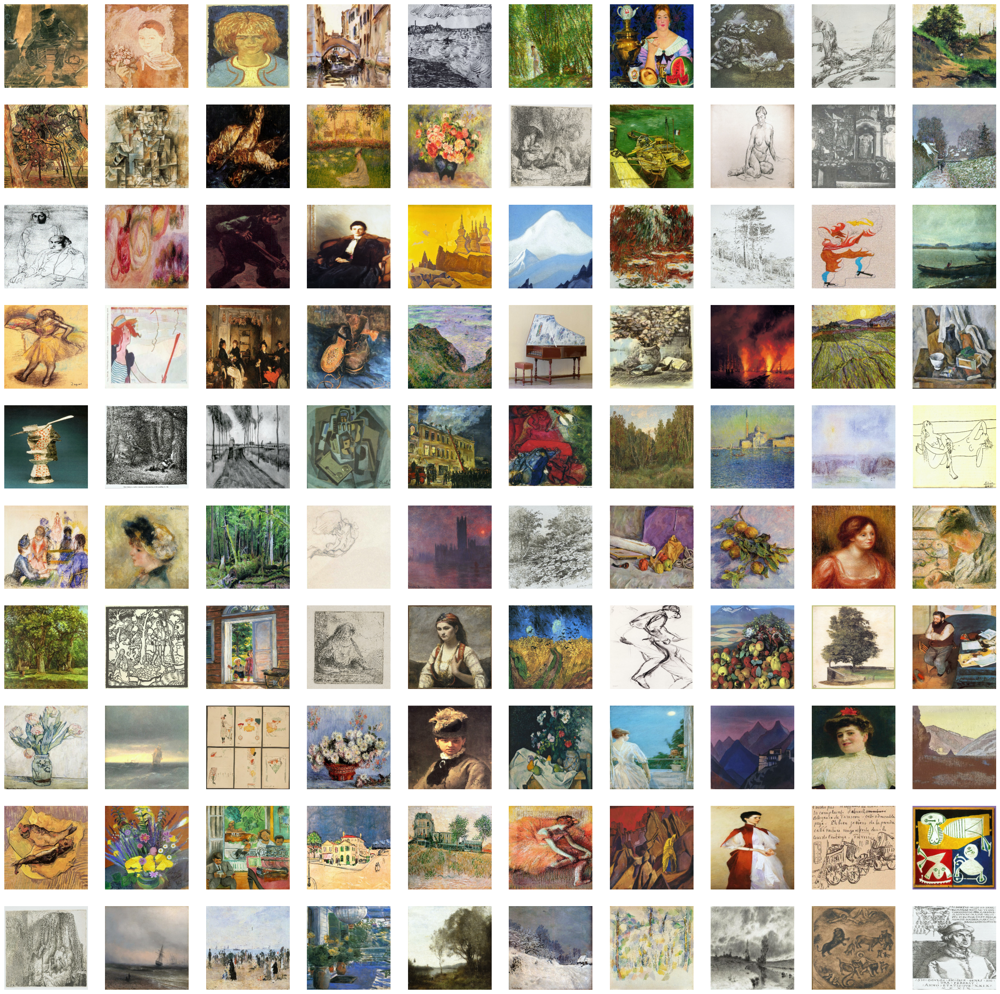

In [ ]:
show_samples(df_train, ds_path)

## Augmentation


In [ ]:
show_augmentation(df_train, ds_path)


## Train
EfficientNet B3 kullanılmıştır.


In [ ]:
IMG_SIZE = (300, 300)
inp = tf.keras.Input(shape=(*IMG_SIZE, 3))

EFFNET_B3 = tf.keras.applications.efficientnet.EfficientNetB3
base_model = EFFNET_B3(include_top=False, weights="imagenet", input_tensor=inp, drop_connect_rate=EFFNET_DROP_CONNCET_RATE)

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(HEAD_DENSE_LAYER,name="head_dense_512", kernel_initializer='he_uniform')(x)
x = tf.keras.layers.Dropout(HEAD_DROPOUT)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)

n_classes = 10  # Toplam sınıf sayısı
output = tf.keras.layers.Dense(n_classes, activation='softmax')(x)

In [ ]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, verbose=1,
                           mode='auto', restore_best_weights=True)

model_chkpoint = tf.keras.callbacks.ModelCheckpoint(
        f'{output_path}/model.h5', monitor='val_loss', verbose=1, save_best_only=True,
        save_weights_only=True, mode='auto', save_freq='epoch')

reduce_lr = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose = False)

rng = [i for i in range(EPOCHS)]
lr_y = [lrfn(x) for x in rng]
plt.figure(figsize=(10, 4))
plt.plot(rng, lr_y, '-o')
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}". \
      format(lr_y[0], max(lr_y), lr_y[-1]))

Eğitim sırasında
kullanılan ancak
modelin görmediği bir
veriden elde edilmiş
performans değeri.


In [ ]:
IMG_SIZE = 300
inp = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
base_model = EFFNET(include_top=False, weights="imagenet", input_tensor=inp, drop_connect_rate=EFFNET_DROP_CONNCET_RATE)


model, model_fe = build_model(N_TOP, return_feature_extractor_model = True)
model.load_weights (f'{output_path}/model.h5')
model.compile(loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
score = model.evaluate(valid_ds, verbose=TF_VERBOSE)
print(f"accuracy valid: {score[1]:.5f}")

Bağımsız ve önceki
gözlemlerle karışmamış
bir test verisinden elde
edilmiş performans
değeri

In [ ]:
y_pred, y_true = [], []
for (X,y) in tqdm(test_ds):
    y_pred.append( model.predict(X))
    y_true.append(y.numpy())

y_true = np.concatenate(y_true)

y_pred = np.concatenate(y_pred)
y_pred = np.argmax(y_pred, axis=1)

score = accuracy_score (y_true, y_pred)
print(f"accuracy test: {score:.5f}")

In [ ]:
with open('class_names.pickle', 'rb') as handle:
    class_names = pickle.load(handle)

In [ ]:
tick_labels = class_names
fig, ax = plt.subplots(figsize=(15,15))
conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(N_TOP))
conf_matrix = conf_matrix/np.sum(conf_matrix, axis=1)
sns.heatmap(conf_matrix, annot=True, fmt=".2f", square=True, cbar=False,
            xticklabels=tick_labels, yticklabels=tick_labels,cmap=plt.cm.YlGn,
            ax=ax)
ax.set_ylabel('Actual')
ax.set_xlabel('Predicted')
ax.set_title('Confusion Matrix')
plt.show()

In [ ]:
print(classification_report(y_true, y_pred, labels=np.arange(N_TOP), target_names=class_names))

In [ ]:
df_test["pred"] = y_pred

In [ ]:
show_predictions (df_test.query("artist_class == pred"), ds_path, class_names)
show_predictions (df_test.query("artist_class != pred"), ds_path, class_names)